In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler 
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import neighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB 
from sklearn.metrics import classification_report
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
#import shap
from sklearn.ensemble import RandomForestClassifier
import lime
import lime.lime_tabular

%matplotlib inline
df = pd.read_csv('cervical.csv')
df.head()

,Age,Numberofsexualpartners,Firstsexualintercourse,Numofpregnancies,Smokes,Smokesyears,Smokespacksyear,HormonalContraceptives,HormonalContraceptivesyears,IUD,...,STDsHPV,STDsNumberofdiagnosis,DxCancer,DxCIN,DxHPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4,15,1,0,0.0,0.0,0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
1,15,1,14,1,0,0.0,0.0,0,0.0,0,...,0,0,0,0,0,0,0,0,0,0
2,52,5,16,4,1,37.0,37.0,1,3.0,0,...,0,0,1,0,1,0,0,0,0,0
3,46,3,21,4,0,0.0,0.0,1,15.0,0,...,0,0,0,0,0,0,0,0,0,0
4,42,3,23,2,0,0.0,0.0,0,0.0,0,...,0,0,0,0,0,0,0,0,0,0


In [2]:
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]/df.shape[0]
print(f'{missing_values *100} %')

Series([], dtype: float64) %


In [3]:
st = df.apply(LabelEncoder().fit_transform)
st.head()

,Age,Numberofsexualpartners,Firstsexualintercourse,Numofpregnancies,Smokes,Smokesyears,Smokespacksyear,HormonalContraceptives,HormonalContraceptivesyears,IUD,...,STDsHPV,STDsNumberofdiagnosis,DxCancer,DxCIN,DxHPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,5,3,5,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,4,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,39,4,6,4,1,29,52,1,18,0,...,0,0,1,0,1,0,0,0,0,0
3,33,2,11,4,0,0,0,1,32,0,...,0,0,0,0,0,0,0,0,0,0
4,29,2,13,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


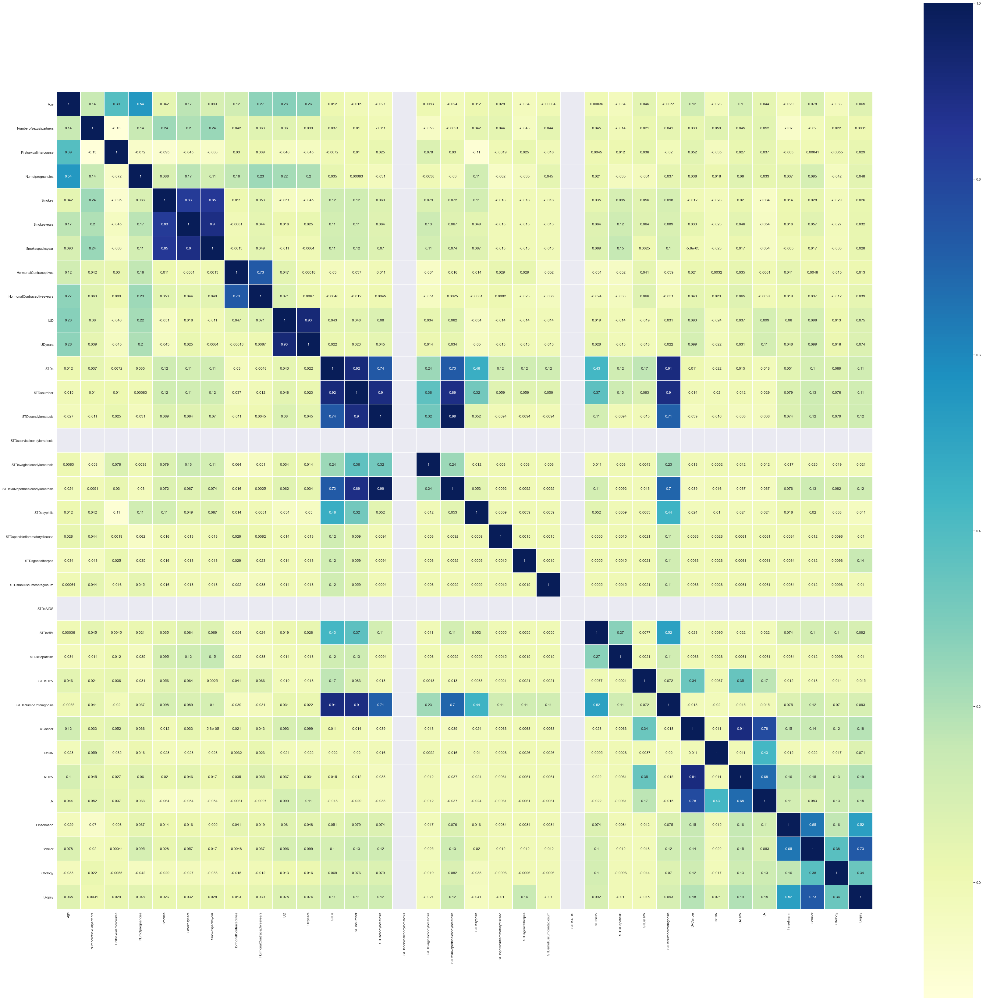

In [22]:
sns.set(color_codes=True)
plt.figure(figsize=(60,60))
sns.heatmap(st.astype(float).corr(), 
            linewidths=0.2, 
            square=True, 
            linecolor='white', 
            annot=True,
            cmap="YlGnBu")
plt.show() # Show co-relation mapping

In [4]:
sc= preprocessing.MinMaxScaler()
df_scaled=sc.fit_transform(df)
scaled_df= pd.DataFrame(df_scaled, columns=df.columns, index=df.index)
scaled_df.head()

,Age,Numberofsexualpartners,Firstsexualintercourse,Numofpregnancies,Smokes,Smokesyears,Smokespacksyear,HormonalContraceptives,HormonalContraceptivesyears,IUD,...,STDsHPV,STDsNumberofdiagnosis,DxCancer,DxCIN,DxHPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,0.070423,0.111111,0.227273,0.090909,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.028169,0.000000,0.181818,0.090909,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.549296,0.148148,0.272727,0.363636,1.0,1.0,1.0,1.0,0.136364,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.464789,0.074074,0.500000,0.363636,0.0,0.0,0.0,1.0,0.681818,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.408451,0.074074,0.590909,0.181818,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
y = scaled_df['Biopsy']
X = scaled_df.drop(columns=['Biopsy'])
X.head()

,Age,Numberofsexualpartners,Firstsexualintercourse,Numofpregnancies,Smokes,Smokesyears,Smokespacksyear,HormonalContraceptives,HormonalContraceptivesyears,IUD,...,STDsHepatitisB,STDsHPV,STDsNumberofdiagnosis,DxCancer,DxCIN,DxHPV,Dx,Hinselmann,Schiller,Citology
0,0.070423,0.111111,0.227273,0.090909,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.028169,0.000000,0.181818,0.090909,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.549296,0.148148,0.272727,0.363636,1.0,1.0,1.0,1.0,0.136364,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.464789,0.074074,0.500000,0.363636,0.0,0.0,0.0,1.0,0.681818,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.408451,0.074074,0.590909,0.181818,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=4)

lgr = make_pipeline(StandardScaler(), LogisticRegression())  #max_iter
model_lgr=lgr.fit(X_train, y_train)


lgr_train_pred = lgr.predict(X_train)
lgr_test_pred = lgr.predict(X_test)

lgr_train_mse = mean_squared_error(y_train, lgr_train_pred)
lgr_test_mse = mean_squared_error(y_test, lgr_test_pred)

print('MSE train data: {:}, MSE test data: {:}'.format(lgr_train_mse, lgr_test_mse))

print('RMSE train data: {:.5}, RMSE test data: {:.5}'.format(
    np.sqrt(np.absolute(lgr_train_mse)), 
    np.sqrt(np.absolute(lgr_train_mse))))
                                                               
print('R2 train data: {:.5}, R2 test data: {:.5}'.format(
    r2_score(y_train,lgr_train_pred),
    r2_score(y_test,lgr_test_pred)))
#test = lgr_test_pred >= .5
#test = test.astype(int)
print(lgr_test_pred)
#print(test)
print(y_test)

cm = confusion_matrix(y_test,lgr_test_pred)
print(cm)
TP = cm[0][0]
FP = cm[0][1]
FN = cm[1][0]
TN = cm[1][1]
print(TP)
print(FP)
print(FN)
print(TN)
accuracy = (TP+TN)/(TP+FP+FN+TN)
print(accuracy)

print(classification_report(y_test, lgr_test_pred))

MSE train data: 0.03161397670549085, MSE test data: 0.014925373134328358
RMSE train data: 0.1778, RMSE test data: 0.1778
R2 train data: 0.52409, R2 test data: 0.48462
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
326    0.0
390    0.0
72     0.0
405    0.0
124    0.0
      ... 
189    0.0
482    0.0
113    0.0
440    0.0
260    0.0
Name: Biopsy, Length: 67, dtype: float64
[[64  1]
 [ 0  2]]
64
1
0
2
0.9850746268656716
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99        65
         1.0       0.67      1.00      0.80         2

    accuracy                           0.99        67
   macro avg       0.83      0.99      0.90        67
weighted avg       0.99      0.99      0.99        67



In [9]:
df.columns

Index(['Age', 'Numberofsexualpartners', 'Firstsexualintercourse',
       'Numofpregnancies', 'Smokes', 'Smokesyears', 'Smokespacksyear',
       'HormonalContraceptives', 'HormonalContraceptivesyears', 'IUD',
       'IUDyears', 'STDs', 'STDsnumber', 'STDscondylomatosis',
       'STDscervicalcondylomatosis', 'STDsvaginalcondylomatosis',
       'STDsvulvoperinealcondylomatosis', 'STDssyphilis',
       'STDspelvicinflammatorydisease', 'STDsgenitalherpes',
       'STDsmolluscumcontagiosum', 'STDsAIDS', 'STDsHIV', 'STDsHepatitisB',
       'STDsHPV', 'STDsNumberofdiagnosis', 'DxCancer', 'DxCIN', 'DxHPV', 'Dx',
       'Hinselmann', 'Schiller', 'Citology', 'Biopsy'],
      dtype='object')

In [32]:
df.columns.size

34

In [36]:
feature = ['Age','Numberofsexualpartners','Firstsexualintercourse',
           'Numofpregnancies','Smokes','Smokesyears','Smokespacksyear',
           'HormonalContraceptives','HormonalContraceptivesyears','IUD',
           'IUDyears','STDs','STDsnumber','STDscondylomatosis',
           'STDscervicalcondylomatosis','STDsvaginalcondylomatosis',
           'STDsvulvoperinealcondylomatosis','STDssyphilis',
           'STDspelvicinflammatorydisease','STDsgenitalherpes',
           'STDsmolluscumcontagiosum','STDsAIDS','STDsHIV','STDsHepatitisB',
           'STDsHPV','STDsNumberofdiagnosis','DxCancer','DxCIN','DxHPV','Dx',
           'Hinselmann','Schiller','Citology']
len(feature)
feature

['Age',
 'Numberofsexualpartners',
 'Firstsexualintercourse',
 'Numofpregnancies',
 'Smokes',
 'Smokesyears',
 'Smokespacksyear',
 'HormonalContraceptives',
 'HormonalContraceptivesyears',
 'IUD',
 'IUDyears',
 'STDs',
 'STDsnumber',
 'STDscondylomatosis',
 'STDscervicalcondylomatosis',
 'STDsvaginalcondylomatosis',
 'STDsvulvoperinealcondylomatosis',
 'STDssyphilis',
 'STDspelvicinflammatorydisease',
 'STDsgenitalherpes',
 'STDsmolluscumcontagiosum',
 'STDsAIDS',
 'STDsHIV',
 'STDsHepatitisB',
 'STDsHPV',
 'STDsNumberofdiagnosis',
 'DxCancer',
 'DxCIN',
 'DxHPV',
 'Dx',
 'Hinselmann',
 'Schiller',
 'Citology']

In [34]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=feature, 
                                                   class_names= 'Biopsy', discretize_continuous=True)

In [37]:
z=len(X_test)

In [38]:
#z=len(X_test)
z=5
while(z):
    z=z-1
    exp = explainer.explain_instance(X_test.iloc[z],lgr.predict_proba,num_features=5, top_labels=None)
    exp.show_in_notebook(show_table=True, show_all=True)

In [19]:
exp.as_list()

[('STDs:genital herpes <= 0.00', -0.812348046378763),
 ('Schiller <= 0.00', -0.4697713535913833),
 ('Dx:CIN <= 0.00', -0.46079493530240173),
 ('Dx:HPV <= 0.00', -0.054394569661149694),
 ('IUD <= 0.00', -0.027127580139326236)]

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=4)

from sklearn.svm import SVC
svm= SVC(kernel="poly", probability=True)
model_svm=svm.fit(X_train, y_train)

svm_train_pred = svm.predict(X_train)
svm_test_pred = svm.predict(X_test)

svm_train_mse = mean_squared_error(y_train, svm_train_pred)
svm_test_mse = mean_squared_error(y_test, svm_test_pred)

print('MSE train data: {:}, MSE test data: {:}'.format(svm_train_mse, svm_test_mse))

print('RMSE train data: {:.5}, RMSE test data: {:.5}'.format(
    np.sqrt(np.absolute(svm_train_mse)), 
    np.sqrt(np.absolute(svm_train_mse))))
                                                               
print('R2 train data: {:.5}, R2 test data: {:.5}'.format(
    r2_score(y_train,svm_train_pred),
    r2_score(y_test,svm_test_pred)))
#accuracy
test_pred = svm_test_pred
#test = test.astype(int)
print(test_pred)
print(y_test)
cm = confusion_matrix(y_test, test_pred)
print(cm)
TP = cm[0][0]
FP = cm[0][1]
FN = cm[1][0]
TN = cm[1][1]
print(TP)
print(FP)
print(FN)
print(TN)
accuracy = (TP+TN)/(TP+FP+FN+TN)
print(accuracy)

print(classification_report(y_test, svm_test_pred))

MSE train data: 0.018302828618968387, MSE test data: 0.029850746268656716
RMSE train data: 0.13529, RMSE test data: 0.13529
R2 train data: 0.72447, R2 test data: -0.030769
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
326    0.0
390    0.0
72     0.0
405    0.0
124    0.0
      ... 
189    0.0
482    0.0
113    0.0
440    0.0
260    0.0
Name: Biopsy, Length: 67, dtype: float64
[[64  1]
 [ 1  1]]
64
1
1
1
0.9701492537313433
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98        65
         1.0       0.50      0.50      0.50         2

    accuracy                           0.97        67
   macro avg       0.74      0.74      0.74        67
weighted avg       0.97      0.97      0.97        67



In [18]:
#z=len(X_test)
z=5
while(z):
    z=z-1
    exp = explainer.explain_instance(X_test.iloc[z],svm.predict_proba,num_features=5, top_labels=None)
    exp.show_in_notebook(show_table=True, show_all=True)